# Day 4, 데이터로 탐험을 떠나요! 🏃‍♀️🏃‍♂️

Day 3 마지막 부분에서 소개해드린 EDA를 진행해주세요.

- 여러분이 선호하는 데이터셋을 선정해주세요

- 이 데이터셋에 대한 여러 가설을 세워주세요.

- 가설을 증명하기 위한 여러 데이터 분석 / 시각화를 진행해주세요.

# 분석 목적
- 연도별 태풍의 발생 빈도와 변화 추이를 해석한다.
- 태풍의 주된 발생 시기를 파악한다.

In [40]:
import pandas as pd
import geopandas as gpd
import numpy as np

df = gpd.read_file('./global/UNISYS_tracks_1956_2018Dec31.shp')
df.head()

,REGION,STORM_NO,NAME,ADVISORY,ADV_DATE,ADV_HOUR,SPEED,PRESSURE,TYPE,LAT,LONG_,geometry
0,S,0,1997-12-02,0,1997-12-03,18,25,0,D,-8.6,0.0,"LINESTRING (-18579223.014 -965763.976, -186014..."
1,I,0,1979-02-11,0,1979-02-11,12,-999,0,D,-16.4,0.0,"LINESTRING (5833141.348 -1792951.710, 5944460...."
2,A,6,FIFI,0,1958-09-06,6,65,0,S,15.6,-55.7,"LINESTRING (-6022384.445 1620951.321, -6200495..."
3,A,6,FRANCES,0,2004-09-02,0,120,939,H,22.2,-71.4,"LINESTRING (-7836892.155 2471668.297, -7948211..."
4,A,3,UNNAMED,0,1948-09-03,0,40,0,S,53.8,-50.0,"LINESTRING (-5721821.827 6912030.437, -5565974..."


### 2. EDA 
- REGION: The region where the storm occurred.
- STORM_NO: A unique identifier for each storm.
- NAME: The name of the storm.
- ADVISORY: The advisory number for the storm.
- ADV_DATE: The date of the advisory.
- ADV_HOUR: The hour of the advisory.
- SPEED: The wind speed of the storm in knots.
- PRESSURE: The atmospheric pressure of the storm.
- TYPE: The type of the storm (e.g., Tropical Storm, Hurricane).
- LAT: The latitude of the storm's location.
- LONG_: The longitude of the storm's location.
- geometry: The geometric representation of the storm's location. (Found in Shape File)

In [41]:
#data type 확인

df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 227574 entries, 0 to 227573
Data columns (total 12 columns):
 #   Column    Non-Null Count   Dtype   
---  ------    --------------   -----   
 0   REGION    227574 non-null  object  
 1   STORM_NO  227574 non-null  int64   
 2   NAME      227574 non-null  object  
 3   ADVISORY  227574 non-null  int64   
 4   ADV_DATE  227506 non-null  object  
 5   ADV_HOUR  227574 non-null  int64   
 6   SPEED     227574 non-null  int64   
 7   PRESSURE  227574 non-null  int64   
 8   TYPE      227563 non-null  object  
 9   LAT       227574 non-null  float64 
 10  LONG_     227574 non-null  float64 
 11  geometry  227202 non-null  geometry
dtypes: float64(2), geometry(1), int64(5), object(4)
memory usage: 20.8+ MB


- 결측치 확인

In [42]:
df.isnull().sum()

REGION        0
STORM_NO      0
NAME          0
ADVISORY      0
ADV_DATE     68
ADV_HOUR      0
SPEED         0
PRESSURE      0
TYPE         11
LAT           0
LONG_         0
geometry    372
dtype: int64

- Numerical Variable 상관관계 파악하기

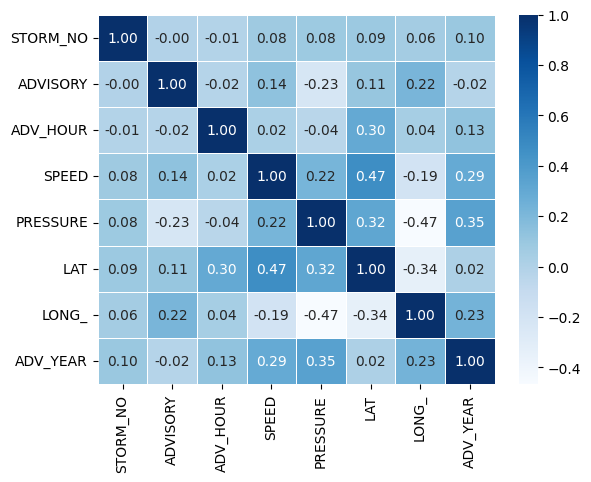

In [140]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(data= df.select_dtypes(['number']).corr(), annot=True, 
fmt = '.2f', linewidths=.5, cmap='Blues')
plt.show()

- 결측치 처리

In [61]:
df = df.dropna(axis = 0 , subset=['ADV_DATE'])
df.isnull().sum()

REGION        0
STORM_NO      0
NAME          0
ADVISORY      0
ADV_DATE      0
ADV_HOUR      0
SPEED         0
PRESSURE      0
TYPE         11
LAT           0
LONG_         0
geometry    372
ADV_YEAR      0
dtype: int64

- 결측치 처리

In [62]:
df['ADV_DATE'] = pd.to_datetime(df['ADV_DATE'])
df['ADV_YEAR'] = df['ADV_DATE'].dt.year

- 태풍 유형별 바람 세기


In [83]:
df[['TYPE','SPEED']].groupby('TYPE').mean()

,SPEED
TYPE,
D,-241.072045
H,94.639124
S,52.317689
U,197.066071


/Users/jykim/opt/anaconda3/envs/DevCourse_6/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/jykim/opt/anaconda3/envs/DevCourse_6/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/jykim/opt/anaconda3/envs/DevCourse_6/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/jykim/opt/anaconda3/envs/DevCourse_6/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/jykim/opt/anaconda3/envs/DevCours

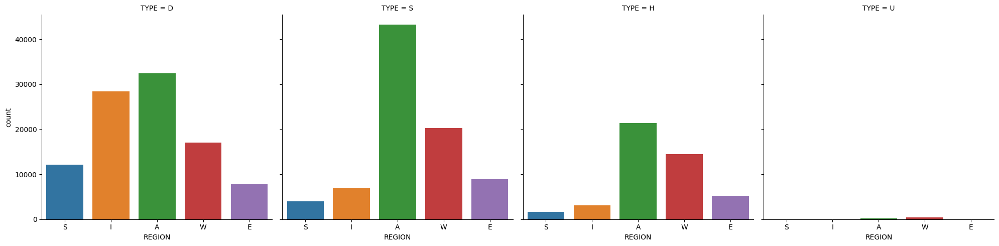

In [58]:
sns.catplot(x='REGION', col='TYPE', kind='count',data=df)
plt.show()

`특정 지역 A에서 여러 TYPE의 잦은 태풍발생이 관측되었다.`

- 연도별 태풍 기압 변화

In [95]:
pres_y = df[['ADV_YEAR','PRESSURE']].groupby('ADV_YEAR').mean()

(1940.0, 2010.0)

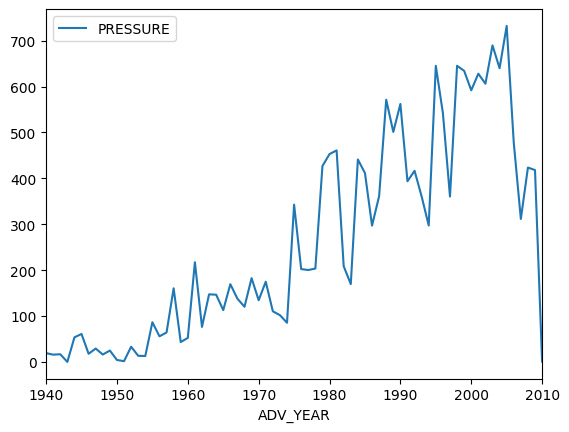

In [101]:

pres_y.plot()
plt.xlim(1940,2010)


In [108]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter_geo(df, 
                     lat='LAT', 
                     lon='LONG_', 
                     hover_name='NAME' ,
                     color='REGION', 
                     title='Storm Locations',
                     )  
fig.update_traces(marker=dict(size=2)) 
fig.update_geos(showcoastlines=True, coastlinecolor="Black", showland=True, )
fig.show()